# <p style="text-align: center;">Análise Exploratório de Dados - HOUSE ROCKET</p>

**<p style="text-align: center;">Descrição das Colunas</p>**


| colunas | descrição
| ------ | ------- |
| id | Unico para cada Imóvel
| date | Data da venda da casa 
| price | Preço
| bedrooms | Total de quartos
| bathrooms | Total de banheiros
| sqft_living | Metragem quadrada do espaço interior
| sqft_lot | Metragem quadrada do espaço terrestre
| floors | Total de andares
| waterfront | vista para o mar ou não
| view | Um índice de 0 a 4 de quão boa era a vista da propriedade.
| condition | Um índice de 1 a 5 sobre as condições do apartamento.
| grade | índice de 1 a 14 sobre a construção e designer.
| sqft_above | A metragem quadrada do espaço interior da habitação que está acima do nível do solo
| sqft_basement | A metragem quadrada do espaço interior da habitação que está abaixo do nível do solo
| yr_built | O ano em que a casa foi construída
| yr_renovated | O ano da última reforma da casa
| zipcode | Em que área de código postal a casa está
| lat | Lattitude
| long | Longitude


**1. Pergunta de negócios**

A House Rocket é uma empresa fictícia cujo modelo de negócio é a compra e venda de imóveis utilizando tecnologia. Sua principal estratégia é comprar boas casas em ótimas localizações a preços baixos e depois revendê-las a preços mais altos. Quanto maior a diferença entre comprar e vender, maior o lucro da empresa e, portanto, maior sua receita. 

Seu CEO em uma busca para maximizar seu lucro está procurando uma análise em seu conjunto de dados para encontrar os melhores negócios disponíveis para eles, comprando a um preço baixo, reformando e vendendo a um preço mais alto, ele também quer saber qual é o melhor preço que poderiam vender para obter o maior lucro possível. Ele quer a resposta para duas perguntas:

* Qual é o imóvel que a House Rocket deve comprar e a que preço?
* Uma vez comprado o imóvel, qual é o melhor momento para vender e a que preço?

# 1. Imports

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from scipy import stats as ss

from IPython.core.display import HTML

import folium
from folium.plugins import MarkerCluster

import warnings
warnings.filterwarnings('ignore')

In [2]:
def jupyter_settings():
    %matplotlib inline
#     %pylab inline
    plt.style.use( 'bmh' )
    plt.rcParams['figure.figsize'] = [25, 12]
    plt.rcParams['font.size'] = 24
    display( HTML( '<style>.container { width:100% !important; }</style>') )
    pd.options.display.max_columns = None
    pd.options.display.max_rows = None
    pd.set_option( 'display.expand_frame_repr', False )
    sns.set()
    
jupyter_settings()

# 2. Carregando os dados

In [3]:
df_raw = pd.read_csv('kc_house_data.csv')
df_raw.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


# 3. Descrição e Limpeza dos Dados

In [4]:
# cópia do dataframe 
df1 = df_raw.copy()

In [5]:

# dimensão do dataset
print(f'Number of columns: {df1.shape[1]}')
print(f'Number of rows: {df1.shape[0]}')

Number of columns: 21
Number of rows: 21613


In [6]:
# tipo das variáveis 
df1.dtypes

id                 int64
date              object
price            float64
bedrooms           int64
bathrooms        float64
sqft_living        int64
sqft_lot           int64
floors           float64
waterfront         int64
view               int64
condition          int64
grade              int64
sqft_above         int64
sqft_basement      int64
yr_built           int64
yr_renovated       int64
zipcode            int64
lat              float64
long             float64
sqft_living15      int64
sqft_lot15         int64
dtype: object

In [7]:
# verificação de valores ausentes
df1.isna().sum()

id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

In [8]:
# verificação de valores duplicados
# checking ['id']
df1.loc[df1['id'].duplicated() == True, 'id'].count() # 177 rows duplicates
df1['id'].value_counts() # show count of row repetitions
df1 = df1.drop_duplicates(subset=['id'], keep='first') # drop duplicate

In [9]:
# mudanças de types das variáveis

df1['id'] = df1['id'].astype('str')
df1['date'] = pd.to_datetime(df1['date'])

df1['bathrooms'] = df1['bathrooms'].astype(int)

df1['waterfront'] = df1['waterfront'].apply(lambda x: 'yes' if x == 1 else 'no')

df1['view'] = df1['view'].apply(lambda x:'No view' if x == 0 else
                 'Fair' if x == 1 else
                 'Average' if x == 2 else
                 'Good' if x == 3 else 'Excellent')

df1['condition'] = df1['condition'].apply(lambda x:'Poor-Worn out' if x == 1 else
                 'Fair - Badly worn' if x == 2 else
                 'Average' if x == 3 else
                 'Good' if x == 4 else 'Very Good')

df1['grade'] = df1['grade'].apply(lambda x: 'Poor' if x in list(range(1,5)) else 
                                 'Average' if x in list(range(5,8)) else
                                 'Good' if x in list(range(8,11)) else 'Excellent')

**Descriptive Statistical**

In [10]:
num_attributes = df1.select_dtypes(include = ['int64', 'float64'])
num_attributes = num_attributes.drop(['yr_built','yr_renovated', 'zipcode', 'lat', 'long', 'sqft_living15','sqft_lot15' ],axis=1)
cat_attributes = df1.select_dtypes(exclude = ['int64', 'float64', 'datetime64[ns]'])
cat_attributes = cat_attributes.drop('id',axis=1)

In [11]:
# Estatística de atributos númericos 

# central tendency - mean, median
c1 = pd.DataFrame(num_attributes.apply(np.mean)).T
c2 = pd.DataFrame(num_attributes.apply(np.median)).T

# dispersion tendency - std, min, max, range, skew, kurtosis
d1 = pd.DataFrame(num_attributes.apply(np.std)).T
d2 = pd.DataFrame(num_attributes.apply(min)).T
d3 = pd.DataFrame(num_attributes.apply(max)).T
d4 = pd.DataFrame(num_attributes.apply(lambda x: x.max() - x.min() )).T
d5 = pd.DataFrame(num_attributes.apply(lambda x: x.skew() )).T
d6 = pd.DataFrame(num_attributes.apply(lambda x: x.kurtosis() )).T

# concat
m = pd.concat([d2,d3,d4,c1,c2,d1,d5,d6]).T.reset_index()
m.columns = ['Attributes', 'Min', 'Max', 'Range', 'Mean', 'Median', 'STD', 'Skew', 'Kurtosis']
m

,Attributes,Min,Max,Range,Mean,Median,STD,Skew,Kurtosis
0,price,75000.0,7700000.0,7625000.0,540529.287180,450000.0,367680.719928,4.028488,34.619079
1,bedrooms,0.0,33.0,33.0,3.371571,3.0,0.929183,1.989860,49.638224
2,bathrooms,0.0,8.0,8.0,1.751679,2.0,0.734839,0.900650,1.998415
3,sqft_living,290.0,13540.0,13250.0,2082.704936,1920.0,919.125029,1.471021,5.249076
4,sqft_lot,520.0,1651359.0,1650839.0,15135.637852,7614.0,41537.651696,13.043673,284.083543
5,floors,1.0,3.5,2.5,1.496198,1.5,0.540376,0.610479,-0.490774
6,sqft_above,290.0,9410.0,9120.0,1790.960440,1560.0,829.007154,1.444221,3.395082
7,sqft_basement,0.0,4820.0,4820.0,291.744495,0.0,442.771655,1.576873,2.711988


In [12]:
# Estatística de atributos categóricos

cat_attributes.apply(lambda x: x.unique().shape[0])

waterfront    2
view          5
condition     5
grade         4
dtype: int64

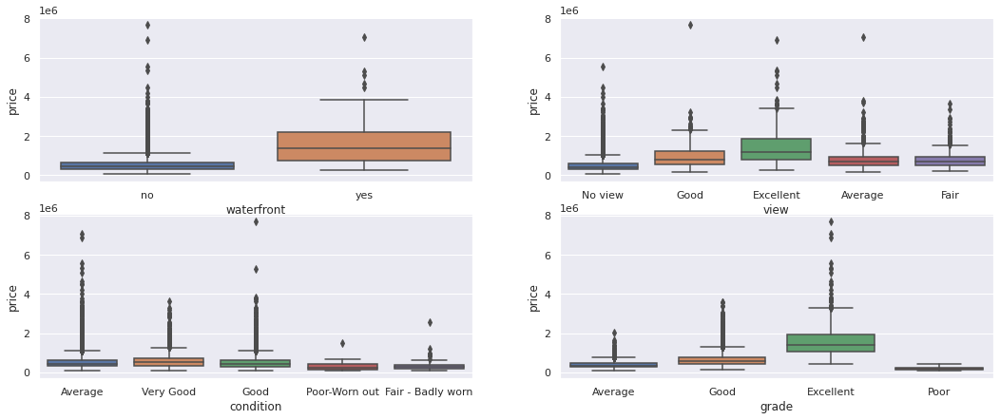

In [13]:
plt.figure(figsize=(18,7))


# waterfront
plt.subplot(2,2,1)
sns.boxplot(x='waterfront', y='price', data=df1)

#view
plt.subplot(2,2,2)
sns.boxplot(x='view', y='price', data=df1)

# condition
plt.subplot(2,2,3)
sns.boxplot(x='condition', y='price', data=df1)

# grade
plt.subplot(2,2,4)
sns.boxplot(x='grade', y='price', data=df1);

**Conclusões:**

 * Total de 21436 de registros.
 * Continha no total de 177 registros duplicados no dataset, sendo eliminados.
 * Sem presença de valores ausentes no dataset.
 * Para melhor entendimento, mundanças para tipo categórico nas variáveis ['waterfront', 'view', 'condition', 'grade']

# 4. Feature Engineering

In [14]:
df2 = df1.copy()

In [15]:
df2['year'] = pd.to_datetime(df2['date']).dt.strftime('%Y')
df2['month'] = pd.to_datetime(df2['date']).dt.strftime('%m')

# criando nova coluna de temporadas
df2['season'] = df2['month'].apply(lambda x: 'spring' if (x == '03') | (x == '04') | (x == '05') else
        'summer' if (x == '06') | (x == '07') | (x == '08') else
        'fall' if (x == '09') | (x == '10') | (x == '11') else
        'winter' if (x == '12') | (x == '01') | (x == '02') else 'NA')

# mediana de preços agrupado por zipcode e season
aux = df2[['price', 'zipcode', 'season']].groupby(['zipcode', 'season']).median().reset_index()
aux.columns = ['zipcode', 'season', 'median_price']

# merge dos dataframes
df2 = pd.merge(df2, aux, how='inner', on=['zipcode', 'season'])



In [16]:
# Removendo colunas não necssárias para está Análise Exploratória
df2 = df2.drop(['sqft_living15', 'sqft_lot15'], axis=1)

In [17]:
# substituindo os valores inconsistente da coluna bedrooms pela média 
df2.loc[df2['bedrooms'] == 33, 'bedrooms'] = int(df2['bedrooms'].mean())

**Conclusões:**

* Criação de novas colunas como: 'month', 'season', 'median_price'
* Presenças de outliers nos dados, foi pressuposto que em sua maioria tem um comportamento adequado para o negócio. 
* Sobre os outliers presentes na coluna 'bedrooms', pressupõe erro de digitação. Alterando, assim, para a média.

# 5. Exploratory Data Analysis - EDA

**Análise Exploratória dos dados: univariada e bivariada**

- Validar hipóteses.
- Produzir Insights para o Negócio.

In [18]:
df3 = df2.copy()

**Análise Univariada**

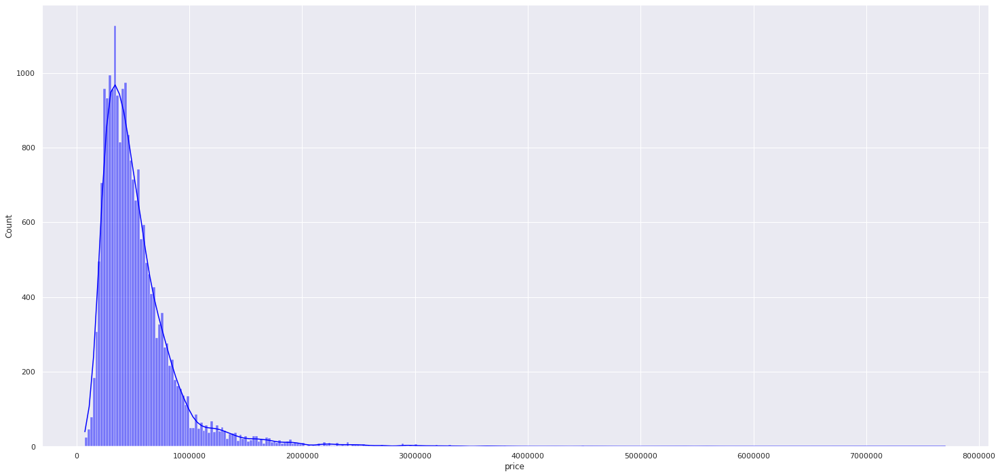

In [19]:
# Histograma dos Preços das casas

ax = sns.histplot(data= df3, x="price", kde=True, color='blue')
ax.ticklabel_format(useOffset=False, style='plain');

**Observações**:

* Shew positivo, então a distribuição tem uma cauda direita (valores acima da média) mais pesada.
* O preço das casas estão concentradas em sua maioria no intervalo de 0 a 1.000.000. Como já observado, como uma mediana de 450.000.



**Observações:**

* No Dataset contém casas em sua maioria com 3 quartos.
* A maioria das casas contêm 2 banheiros.
* E a maioria tem apenas 1 andar.

In [20]:
# Análise Univariada das variáveis categóricas.

cat_attributes = df3.select_dtypes(exclude = ['int64', 'float64', 'datetime64[ns]'])
cat_attributes = cat_attributes.drop('id',axis=1)
cat_attributes.apply(lambda x: x.unique().shape[0])

waterfront     2
view           5
condition      5
grade          4
year           2
month         12
season         4
dtype: int64

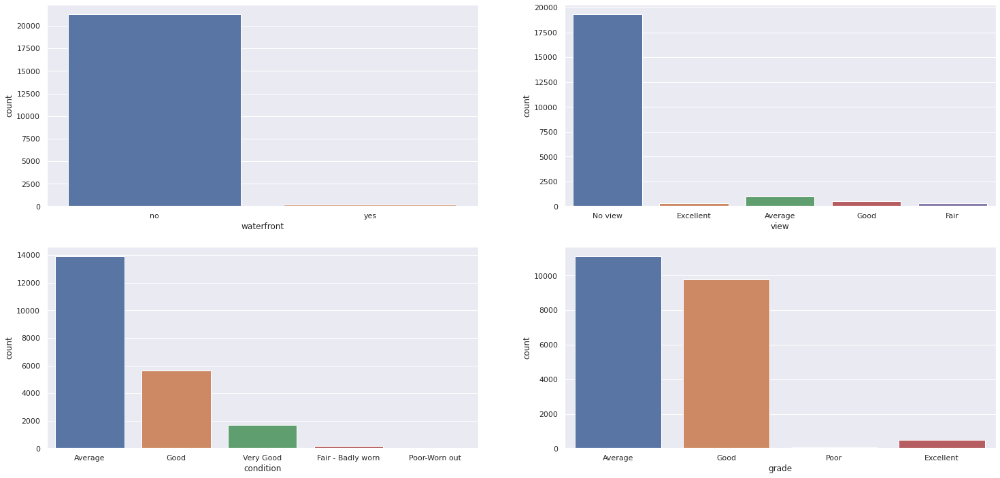

In [21]:
# Gráficos de Waterfron, View, Condition e grade

plt.subplot( 2, 2, 1 )
sns.countplot(x= df3['waterfront'])

plt.subplot( 2, 2, 2 )
sns.countplot(x= df3['view'])

plt.subplot( 2, 2, 3 )
sns.countplot(x= df3['condition'])

plt.subplot( 2, 2, 4 )
sns.countplot(x= df3['grade']);


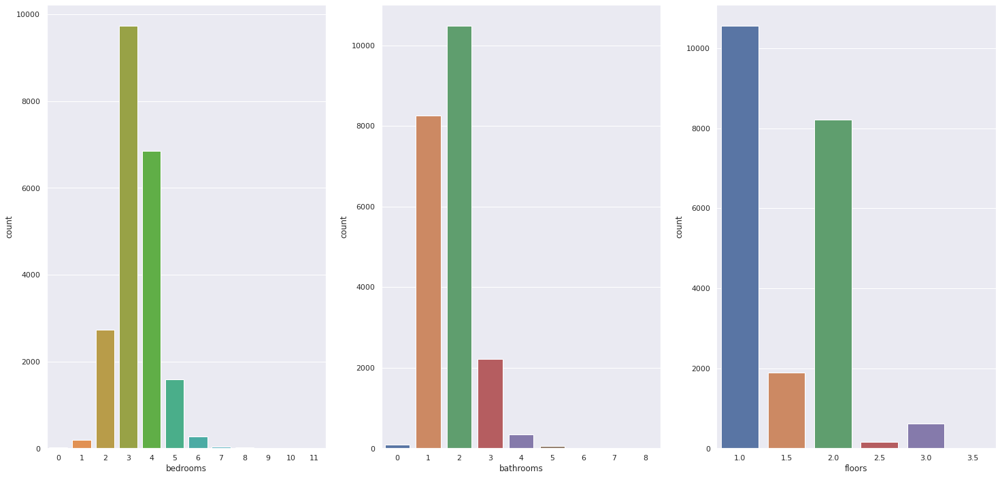

In [22]:
# Distribuição de Frequência 

# bedrooms
plt.subplot(1,3,1)
sns.countplot(x= 'bedrooms', data=df3)

# bathrooms
plt.subplot(1,3,2)
sns.countplot(x= 'bathrooms', data=df3)

# floors
plt.subplot(1,3,3)
sns.countplot(x= 'floors', data=df3);



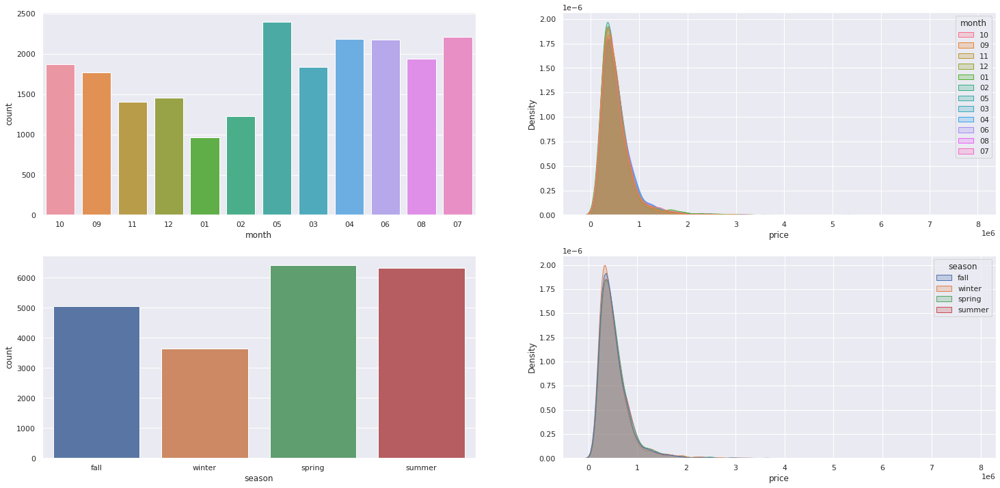

In [23]:
# Gráficos de Month e Season 

plt.subplot( 2, 2, 1 )
sns.countplot(x= df3['month'])
plt.subplot( 2, 2, 2 )
sns.kdeplot(data=df3, x='price',hue='month', fill=True, common_norm=False)

plt.subplot( 2, 2, 3 )
sns.countplot(x= df3['season'])
plt.subplot( 2, 2, 4 )
sns.kdeplot(data=df3, x='price',hue='season', fill=True, common_norm=False);

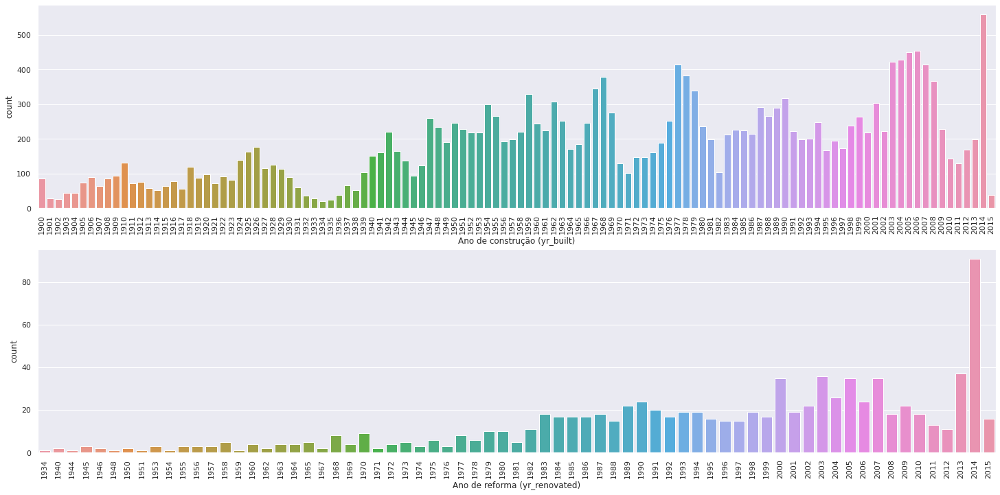

In [24]:
# Distribuição de frequência das casas sobre o seu ano de construção e reforma.
plt.subplot(2,1, 1)
ax = sns.countplot(x=df3['yr_built'])
ax.set(xlabel = 'Ano de construção (yr_built)')
plt.xticks(rotation=90);


plt.subplot(2,1,2)
aux = df3.loc[df3['yr_renovated'] != 0, :]
ax = sns.countplot(x=aux['yr_renovated'])
ax.set(xlabel = 'Ano de reforma (yr_renovated)')
plt.xticks(rotation=90);


In [25]:
print(f'Das {len(df3)} casas cadastradas, {len(aux)} são de casas reformadas.')

Das 21436 casas cadastradas, 910 são de casas reformadas.


**Observação:**

* É possivel observar que a maioria das casas foram construidas e reformadas no ano de 2014.

**Análise Bivariada**

In [26]:
df4 = df3.copy()

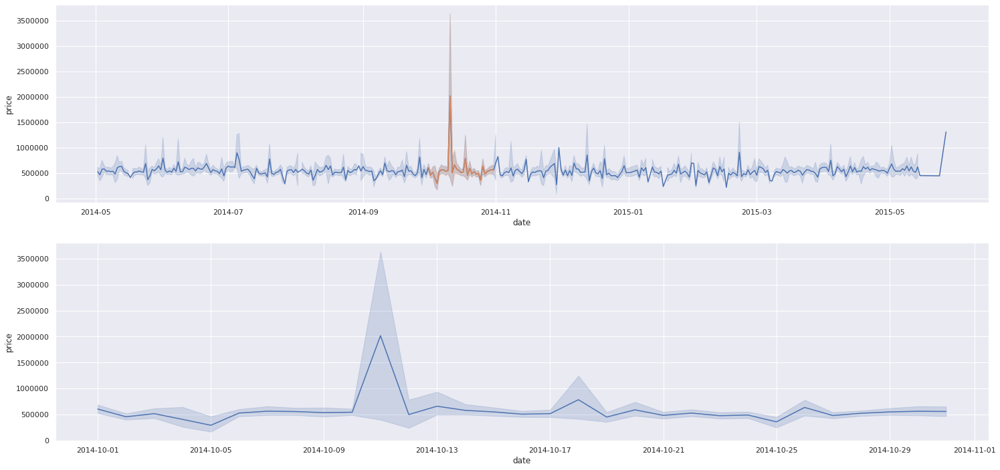

In [27]:
# Evolução dos preços ao longo do tempo

# date
date_price = df4[['price', 'date', 'month', 'year']]

plt.subplot(2,1,1)
plt.ticklabel_format(style='plain')
sns.lineplot(data=date_price, x='date', y='price');

# year
plt.subplot(2,1,1)
# plt.ticklabel_format(style='plain')
only_10 = date_price.loc[(date_price['year'] == '2014') & (date_price['month'] == '10'),:]
sns.lineplot(data= only_10, x='date', y='price' );

plt.subplot(2,1,2)
plt.ticklabel_format(style='plain')
only_10 = date_price.loc[(date_price['year'] == '2014') & (date_price['month'] == '10'),:]
sns.lineplot(data= only_10, x='date', y='price' );

In [28]:
df3.loc[(df3['year'] == '2014') & (df3['month'] == '10'),:].sort_values(by = 'price', ascending= False).head(3)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,year,month,season,median_price
15136,6762700020,2014-10-13,7700000.0,6,8,12050,27600,2.5,no,Good,Good,Excellent,8570,3480,1910,1987,98102,47.6298,-122.323,2014,10,fall,740000.0
11761,1247600105,2014-10-20,5110800.0,5,5,8010,45517,2.0,yes,Excellent,Average,Excellent,5990,2020,1999,0,98033,47.6767,-122.211,2014,10,fall,627000.0
21400,6447300265,2014-10-14,4000000.0,4,5,7080,16573,2.0,no,No view,Average,Excellent,5760,1320,2008,0,98039,47.6151,-122.224,2014,10,fall,2450000.0


**Observações:**

* O pico de crescimento indicado no periodo de outubro de 2014 é justificado pelo outlier do imóvel com o preço de 7.700.000.


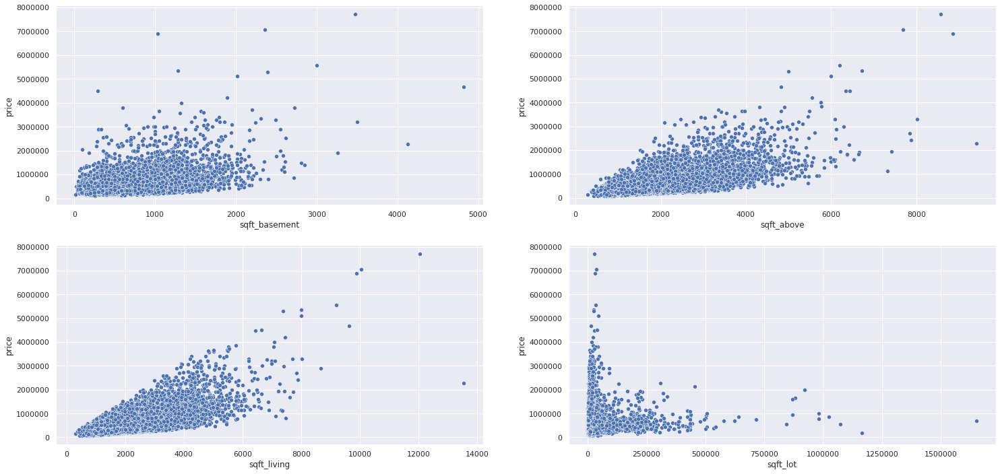

In [29]:
# Gráfico de dispersão mostrando a relação entre o preço do imovel e as variáveis [tamanho do porão, tamanho do imovel acima do nivel, 
# o tamanho do imovel e o tamanho do lot]


plt.subplot(2,2,1)
plt.ticklabel_format(style='plain')
aux = df4.loc[df4['sqft_basement'] > 0, :]
sns.scatterplot(data=aux, x= 'sqft_basement', y='price')

plt.subplot(2,2,2)
plt.ticklabel_format(style='plain')
sns.scatterplot(data=df4, x= 'sqft_above', y='price')

plt.subplot(2,2,3)
plt.ticklabel_format(style='plain')
sns.scatterplot(data=df4, x= 'sqft_living', y='price')

plt.subplot(2,2,4)
plt.ticklabel_format(style='plain')
sns.scatterplot(data=df4, x= 'sqft_lot', y='price');

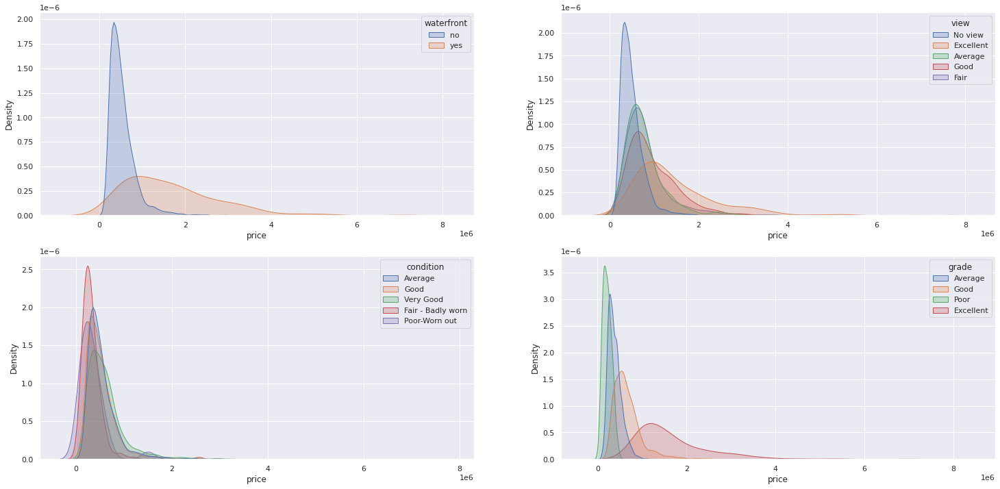

In [30]:
# Gráfico de estimativa de densidade do preço com as variaveis categóricas

plt.subplot( 2, 2, 1 )
sns.kdeplot(data=df4, x='price',hue='waterfront', fill=True, common_norm=False)

plt.subplot( 2, 2, 2 )
sns.kdeplot(data=df4, x='price',hue='view', fill=True, common_norm=False);

plt.subplot( 2, 2, 3 )
sns.kdeplot(data=df4, x='price',hue='condition', fill=True, common_norm=False)

plt.subplot( 2, 2, 4 )
sns.kdeplot(data=df4, x='price',hue='grade', fill=True, common_norm=False);

In [31]:
df4.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'year', 'month', 'season', 'median_price'],
      dtype='object')

**Correlação**

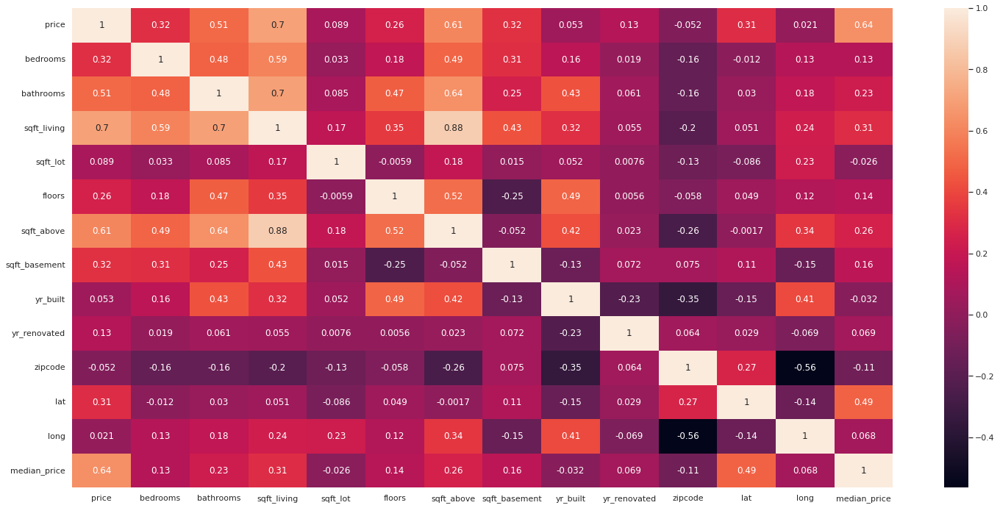

In [32]:
num_attributes = df4.select_dtypes(include = ['int64', 'float64'])
correlation = num_attributes.corr(method='pearson')
sns.heatmap(correlation, annot=True);

**Observações:**

* As variáveis sqft_living e sqft_above tem uma correlação positiva com o preço do imovel. 

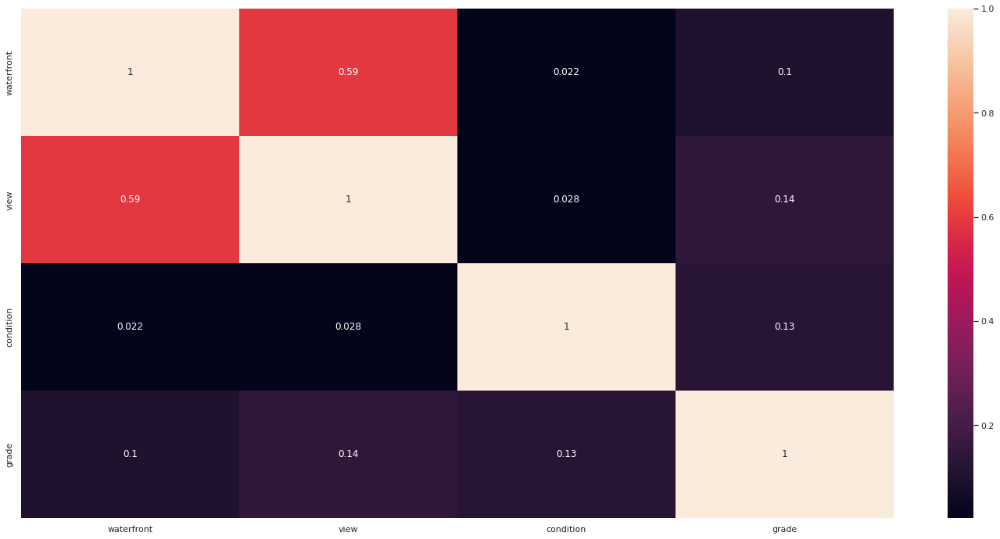

In [33]:
# correlação entre variavel categóricas (Cramers'V)

def cramer_v( x, y ):
    # tabela de contigencia/ matriz de confusão dos meus dados categoricos
    cm = pd.crosstab( x, y ).values
    n = cm.sum()
    r, k = cm.shape
    
    chi2 = ss.chi2_contingency( cm )[0]
    
    # correção de vies
    chi2corr = max( 0, chi2 - (k-1)*(r-1)/(n-1) )
    kcorr = k - (k-1)**2/(n-1)
    rcorr = r - (r-1)**2/(n-1)
    
    return np.sqrt( (chi2corr/n) / ( min( kcorr-1, rcorr-1 ) ) )

# only categorical data
df_cat = df4.select_dtypes(include='object')

# calculate cramer V
a1 = cramer_v(df_cat['waterfront'], df_cat['waterfront'])
a2 = cramer_v(df_cat['waterfront'], df_cat['view'])
a3 = cramer_v(df_cat['waterfront'], df_cat['condition'])
a4 = cramer_v(df_cat['waterfront'], df_cat['grade'])

a5 = cramer_v(df_cat['view'], df_cat['waterfront'])
a6 = cramer_v(df_cat['view'], df_cat['view'])
a7 = cramer_v(df_cat['view'], df_cat['condition'])
a8 = cramer_v(df_cat['view'], df_cat['grade'])

a9 = cramer_v(df_cat['condition'], df_cat['waterfront'])
a10 = cramer_v(df_cat['condition'], df_cat['view'])
a11 = cramer_v(df_cat['condition'], df_cat['condition'])
a12 = cramer_v(df_cat['condition'], df_cat['grade'])

a13 = cramer_v(df_cat['grade'], df_cat['waterfront'])
a14 = cramer_v(df_cat['grade'], df_cat['view'])
a15 = cramer_v(df_cat['grade'], df_cat['condition'])
a16 = cramer_v(df_cat['grade'], df_cat['grade'])


# final dataset
d = pd.DataFrame({'waterfront': [a1, a2, a3, a4],
                 'view': [a5, a6, a7, a8],
                 'condition': [a9, a10, a11, a12],
                 'grade': [a13, a14, a15, a16]})

d = d.set_index( d.columns )

sns.heatmap( d, annot= True);


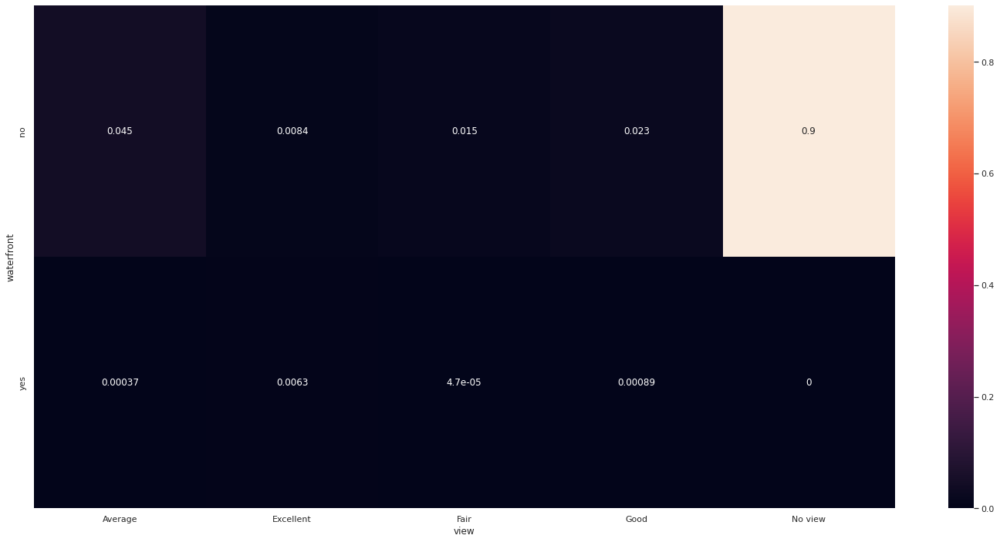

In [34]:
# Teste de Qui-quadrado nas variaveis categóricas view e waterfront
# tabela de contigência das duas variáveis

aux = pd.crosstab(df_cat['waterfront'], df_cat['view'], normalize=True)
sns.heatmap(aux, annot=True);

**Teste Chi-quadrado para Associação**

- Realizado o teste Chi-quadrado para associação entre as variáveis "waterfront" e "view".
- Temos as seguintes hipóteses:
    * H nula: Variáveis sem associação (Independentes)
    * H alternativa:  Variáveis que estão associadas.
    
**- Considerado nivel de insignificância: 0,05.**

In [35]:
chi2 = ss.chi2_contingency( aux )
print(f'Teste qui-quadrado: {chi2[0]:.4f}')
print(f'p_valor: {chi2[1]:.4f}')
print(f'Graus de liberdade: {chi2[2]}')

Teste qui-quadrado: 0.3537
p_valor: 0.9861
Graus de liberdade: 4


**O p_valor > 0,05. Logo, não podemos rejeitar a Hipótese Nula. As variáveis podem ser independentes.**

**Hipóteses que serão validadas atráves da Análise Exploratória.**

In [36]:
df5 = df4.copy()

* **Hipótese 1:** Geralmente os imóveis com vista para o mar são 30% mais caros em média.
* **Hipótese 2:** Imóveis com ano de construção inferior a 1955 são 50% mais baratos em média.
* **Hipótese 3:** Imóveis sem porão, possuem um lote de m² maior cerca de 40% em média.
* **Hipótese 4:** O crescimento dos preços dos imóveis em relação ao ano anterior é de 10%.
* **Hipótese 5:** Imóveis com 3 banheiros têm um crescimento de preço MoM de 15%.

**Hipótese 1: Geralmente os imóveis com vista para o mar são 30% mais caros em média.**

In [37]:
h1 = df5[['waterfront', 'price']].groupby('waterfront').mean().reset_index()
# variação percentual entre os preços:
# (preço final / preço inicial -1 )*100
x = (h1.loc[1, 'price'] / h1.loc[0, 'price'] - 1) * 100
print(f'Falso, na verdade, imóveis com vista para o mar são {x:.2f}% mais caros, em média.')



# PLOT
fig = px.bar(h1, x='waterfront', y='price',
            title='Waterfornt View Average Price',
           color_discrete_sequence=['darkorange'], height=700)
fig.show()

display(h1)

Falso, na verdade, imóveis com vista para o mar são 212.42% mais caros, em média.


,waterfront,price
0,no,5.319372e+05
1,yes,1.661876e+06


**Hipótese 2: Imóveis com ano de construção inferior a 1955 são 50% mais baratos em média.**

In [38]:
df_yr = df5[['price', 'yr_built']].groupby('yr_built').mean().reset_index()
h2 = df_yr.loc[df_yr['yr_built'] < 1955, :]
h2['median_all_yr'] = df5['price'].mean()

# plot
fig = px.line(h2, x="yr_built", y="price", title='Year Built 1900-1955 Average')
# add uma linha da média geral
fig1 = fig.add_traces(go.Scatter(x=h2.yr_built, y=h2.median_all_yr, mode='lines', name='Mean of price'))
fig1.show()

**Hipótese 3:** Imóveis sem porão, possuem um lote de m² maior cerca de 40% em média.

In [39]:
df5['basement'] = df5['sqft_basement'].apply(lambda x: 'no' if x == 0 else 'yes')
# calcular a mediana (para tirar os outliers e descobrir a mediana do tamanho do lot com e sem o porão)
df = df5[['basement', 'sqft_lot']].groupby('basement').median().reset_index()

# variação percentual entre os preços:
# (preço final / preço inicial -1 )*100
x = (df.loc[1, 'sqft_lot'] / df.loc[0, 'sqft_lot'] - 1) * 100

print(f'Falso, propriedades sem porão na mediana são quase {x*-1:.2f}% maiores do que propriedades com.')
# PLOT
fig = px.bar(df, x='basement', y='sqft_lot', title='Mediana de Imóveis com ou sem porão',
             color_discrete_sequence=['purple'])
fig.show()

Falso, propriedades sem porão na mediana são quase 1.66% maiores do que propriedades com.


**Hipótese 4:** O crescimento dos preços dos imóveis em relação ao ano anterior é de 10%.

In [40]:
# new feature
df5['years'] = pd.to_datetime(df5['date']).dt.strftime('%Y')
# suprimir a notação cientifica dos dados
pd.set_option('display.float_format', lambda x: '%.2f' % x)
df = df5[['price', 'years']].groupby('years').mean().reset_index()
# variação percentual entre os preços:
# (preço final / preço inicial -1 )*100
x = (df.loc[1, 'price'] / df.loc[0, 'price'] - 1) * 100
print(f'Falso. Tem um aumento de {x:.2f} YoY.')
# plot
fig = px.bar(df, x='years', y='price', title='Preço médio de crescimento ano a ano',
             color_discrete_sequence=['darkorange'])
fig.show()

Falso. Tem um aumento de 0.70 YoY.


**Hipótese 5:** Imóveis com 3 banheiros têm um crescimento de preço MoM de 15%.

In [41]:


df5['month_y'] = df5['date'].dt.strftime('%Y-%m')

df = df5.loc[df5['bathrooms'] == 3, :]

df_plot = df[['price', 'month_y']].groupby('month_y').mean().reset_index()

# variação percentual entre os preços:
# (preço final / preço inicial -1 )*100
ls = []
for i in range(len(df_plot) - 1):
    x = (df_plot.loc[i + 1, 'price'] / df_plot.loc[i, 'price'] - 1) * 100
    ls.append(x)

ls.insert(0,0)

df_plot['% MoM'] = ls
df_plot = df_plot.rename(columns = {'month_y': 'Mês', 'price': 'Média preço'})


s = df_plot['% MoM'].sum()
display(df_plot.T)
print(f'Falso, o crescimento MoM foi de {s:.2f}%.')


# plot
fig = px.line(df_plot, x="Mês", y="Média preço", title='Crescimento MoM Preço Médio de Imóveis com 3 banheiros')
fig.show()

,0,1,2,3,4,5,6,7,8,9,10,11,12
Mês,2014-05,2014-06,2014-07,2014-08,2014-09,2014-10,2014-11,2014-12,2015-01,2015-02,2015-03,2015-04,2015-05
Média preço,876058.16,885722.16,870993.33,923601.62,812554.25,850915.21,874401.28,896767.03,873425.71,836043.32,948388.93,923289.75,959317.69
% MoM,0.00,1.10,-1.66,6.04,-12.02,4.72,2.76,2.56,-2.60,-4.28,13.44,-2.65,3.90


Falso, o crescimento MoM foi de 11.31%.


**Problemas de Negócios**

**Questão 1:** Qual é o imóvel que a House Rocket deve comprar e a que preço?

In [42]:
# questão 01
df_q1 = df1.copy()
# agrupando em um dataframe as medianas agrupados por zipcode

df = df_q1[['price', 'zipcode']].groupby('zipcode').median().reset_index()
# mudando os nomes das colunas
df.columns = ['zipcode', 'median_price']
# merge os dados df com data
df_merge = pd.merge(df_q1, df, how='inner', on="zipcode")

df_merge['status'] = np.where((df_merge['price'] < df_merge['median_price']) & 
                              (df_merge['condition'] == 'Average') | (df_merge['condition'] == 'Good') | 
                              (df_merge['condition'] == 'Very Good'), 
                              'buy', "don't buy")

# criando um dataframe para o relatório
data_1 = df_merge[['id', 'zipcode', 'price', 'median_price', 'condition', 'status', 'lat', 'long']]


In [43]:
data_1.loc[data_1['status'] == 'buy',:].head(10)

,id,zipcode,price,median_price,condition,status,lat,long
0,7129300520,98178,221900.00,279000.00,Average,buy,47.51,-122.26
1,4060000240,98178,205425.00,279000.00,Good,buy,47.50,-122.25
3,2976800796,98178,236000.00,279000.00,Average,buy,47.51,-122.25
4,6874200960,98178,170000.00,279000.00,Average,buy,47.50,-122.27
5,4268200055,98178,245000.00,279000.00,Average,buy,47.49,-122.22
6,3969300030,98178,165000.00,279000.00,Average,buy,47.49,-122.24
9,1180003090,98178,190000.00,279000.00,Average,buy,47.50,-122.22
10,561000075,98178,260000.00,279000.00,Good,buy,47.51,-122.26
12,7812800565,98178,289500.00,279000.00,Good,buy,47.50,-122.24
13,3348401740,98178,188000.00,279000.00,Average,buy,47.50,-122.27


* Foi agrupado por CEP dos dados e calculado o preço médio de cada imóvel.
* Mesclado esses dados com o conjunto de dados inicial.
* Criei um novo atributo 'status' que indica se o imóvel está bom para compra ou não, através dos seguintes critérios: preço abaixo da média e condição 'avegare', 'good' ou 'very good' é bom para compra.

In [44]:
data_plot = df_merge.loc[df_merge['status'] == 'buy',:]

In [45]:
# plot map

map_density = folium.Map(location=[data_plot['lat'].mean(), data_plot['long'].mean()],
                             default_zoom_start=15)

# adicinando os pontos no mapa
marker_cluster = MarkerCluster().add_to(map_density)

for name, row in data_plot.iterrows():
    folium.Marker([row['lat'], row['long']],
                      popup=f'Sold $ {row["price"]}, \n'
                            f'Features: {row["date"]}, \n'
                            f'sqft: {row["sqft_living"]}, \n'
                            f'{row["bedrooms"]} bedrooms, \n'
                            f'{row["bathrooms"]} bathrooms, \n'
                            f'year built: {row["yr_built"]} \n').add_to(marker_cluster)

map_density

**Visualização dos imóveis recomendados para Compra.**

**Questão 2:** Uma vez comprado o imóvel, qual é o melhor momento para vender e a que preço?

In [46]:
df_q2 = data_plot.copy()

In [47]:

df_q2['date'] = pd.to_datetime(df1['date']).dt.strftime('%Y-%m-%d')
df_q2['monthy'] = pd.to_datetime(df_q2['date']).dt.strftime('%m')
# criando nova coluna de temporadas
df_q2['season'] = df_q2['monthy'].apply(lambda x: 'spring' if (x == '03') | (x == '04') | (x == '05') else
    'summer' if (x == '06') | (x == '07') | (x == '08') else
    'fall' if (x == '09') | (x == '10') | (x == '11') else
    'winter' if (x == '12') | (x == '01') | (x == '02') else None)

# mediana de preços agrupado por zipcode e season
df_season = df_q2[['price', 'zipcode', 'season']].groupby(['zipcode', 'season']).median().reset_index()
df_season.columns = ['zipcode', 'season', 'median_for_season']

# merge dos dataframes
df_merge = pd.merge(df_q2, df_season, how='inner', on=['zipcode', 'season'])

# preço de vendas
df_merge['price_sale'] = np.where(df_merge['price'] > df_merge['median_for_season'],
                             df_merge['price'] * 1.3,
                             df_merge['price'] * 1.1)
# lucro
df_merge['profit'] = df_merge['price_sale'] - df_merge['price']
# criando o relatório
data_2 = df_merge[['id', 'zipcode', 'season', 'median_for_season', 'price', 'price_sale', 'profit', 'status']]
data_2.columns = ['ID', 'ZIPCODE', 'SEASON', 'MEDIAN FOR SEASON', 'BUY PRICE', 'SALE PRICE', 'PROFIT', 'STATUS']



* Adiciona um novo atributo 'temporada' no conjunto de dados.
* Agrupa por CEP e temporada e peguei os preços médios.
* Novo atributo 'price_sale': o preço acima da média aumenta em 30%, abaixo da média aumenta apenas em 10%.
* O atributo 'profit' é calculado pela diferença entre 'price' e 'price_sale'.

In [48]:
data_2.sample(5) # 5 amostra aleatória do dataset

,ID,ZIPCODE,SEASON,MEDIAN FOR SEASON,BUY PRICE,SALE PRICE,PROFIT,STATUS
10925,7338402690,98108,summer,320000.00,335000.00,435500.00,100500.00,buy
4419,7137960110,98092,spring,267300.00,284000.00,369200.00,85200.00,buy
2190,8617000020,98007,spring,487500.00,485000.00,533500.00,48500.00,buy
3533,5693500760,98103,winter,482000.00,570000.00,741000.00,171000.00,buy
11057,3361400190,98168,spring,209000.00,190000.00,209000.00,19000.00,buy


Através desse DataFrame é possivel visualizar o PROFIT do Imóvel em difentes estações do ano. 

In [49]:
# média de lucro por Season dos Imóveis recomendados para Compra.
data_2[['SEASON', 'PROFIT']].groupby('SEASON').mean().reset_index().sort_values(by= 'PROFIT', ascending= False)

,SEASON,PROFIT
0,fall,104245.03
1,spring,104164.52
3,winter,102933.58
2,summer,102601.91


**A margem de Lucro por venda é maior na temporada de Outono**